In [24]:
import numpy as np
import xarray as xr
import matplotlib
import math


from xarray import DataTree
# from xmip.postprocessing import _parse_metric

import cartopy.crs as ccrs

# import xskillscore as xs
import matplotlib.pyplot as plt
%matplotlib inline
import calendar
from matplotlib.lines import Line2D

import os
import re
import seaborn as sns
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from scipy.stats import norm
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import matplotlib.patches as patches

import pandas as pd
from scipy.stats import norm
from scipy.special import erfc


# Plotting SST gradient, trend for all percentiles, and trend Vs. mean state plots 

### SST gradient 
east-west and cold-warm temperature gradients 
east-west: 

lon and lat are 

cold-warm 


warmest 50% minus codlest 50%

### Trend for all percentiles 

Maximum spread and standard error

### trend vs. mean state 

subfig 1: trend coldes 15% vs. cold-warm trend
subfig 2: ect. 

--------------------------------

## Load Data 

Processed on Gadi

In [25]:
noaa_metrics = {'percentiles': 0.000776700915003186, 'eulerian': 0.0011179155352855083}
cobe_metrics = {'percentiles': 0.0008697542122712153, 'eulerian': 0.0010641552293092658}
hadley_metrics = {'percentiles': 0.0006815426391838442, 'eulerian': 0.0009097251046705565}

had_cold_warm = hadley_metrics['percentiles'] 
cobe_cold_warm = cobe_metrics['percentiles']
noaa_cold_warm = noaa_metrics['percentiles']

had_east_west = hadley_metrics['eulerian']
cobe_east_west = cobe_metrics['eulerian']
noaa_east_west = noaa_metrics['eulerian']

Function to make a large array so you can plot with seaborn. 

In [26]:
dt_cmip_cold_warm = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cold_warm_trend_cmip_pacific_198201-202001_lat20.nc')
dt_cmip_east_west = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_east_west_trend_cmip_pacific_198201-202001_lat20.nc')

In [27]:
models =['CESM1-CAM5',
 'CanESM2',
 'GFDL-ESM2M',
 'MPI-ESM',
 'ACCESS-ESM1-5',
 'CanESM5',
 'EC-Earth3',
 'IPSL-CM6A-LR',
 'MIROC-ES2L',
 'MIROC6',
 'MPI-ESM1-2-LR',
 'CESM2',
 'GFDL-SPEAR-MED']

data_tree=dt_cmip_east_west

mods = {}
for model_name, model_data in data_tree.items():
    en=[]
    for ensemble_name, ensemble_data in data_tree[model_name].items():
        en.extend([str(ensemble_name)])
    
    mods[str(model_name)]=en

In [46]:
# code needed to use seaborn - getting it to be a data array 
# data input needs to be in datatree form: 
#                                         models
#                                           |_______ ensemble members

def main_dataarray(data):

    trend_dt=data
    model_array={}
    # # print('converting datatree to arrays for each model')
    for m in range(len(models)):
        
        sources = mods[models[m]][0:len(mods[models[m]])]
        da=[] # initialise array for grad values
        for i in range(len(sources)):
            da.extend([trend_dt[models[m]+'/'+sources[i]].grad.values.item()]) # for east-west and cold-warm temp gradients remove square brackets, also change trend to grad
        model_array[m]= xr.DataArray(da, dims = 'ensemble_members',coords = {'ensemble_members':sources})
    
    print('initial arrays done')
    
    # Create an empty DataArray
    main_array = xr.DataArray()
    
    ensemble_sizes = [len(mods[models[m]]) for m in range(len(models))] # list of ensemble sizes
    
    # Loop through each model
    for model, ensemble_size in zip(models, ensemble_sizes):
        # Generate random data for the example
        data_values = model_array[models.index(model)] 
        ensemble_members = mods[model]
    
        # Create a DataArray for each ensemble member
        data = xr.DataArray(
            data_values,
            dims=['ensemble_member'],
            coords={'ensemble_member': ensemble_members},
            name='temp'
        )
    
        # Concatenate along a new dimension representing different models
        main_array = xr.concat([main_array, data], dim='model')
    
    print('main_array_done')

    return main_array



In [47]:
# code needed to use seaborn - getting it to be a data array 
# data input needs to be in datatree form: 
#                                         models
#                                           |_______ ensemble members

def main_dataarray_trend_type(data):

    trend_dt=data
    model_array={}
    # # print('converting datatree to arrays for each model')
    for m in range(len(models)):
        
        sources = mods[models[m]][0:len(mods[models[m]])]
        da=[] # initialise array for grad values
        for i in range(len(sources)):
            da.extend([trend_dt[models[m]+'/'+sources[i]].grad.values[0]]) # for east-west and cold-warm temp gradients remove square brackets, also change trend to grad
        
        model_array[m]= xr.DataArray(da, dims = 'ensemble_members',coords = {'ensemble_members':sources})
    
    print('initial arrays done')
    
    # Create an empty DataArray
    main_array = xr.DataArray()
    
    ensemble_sizes = [len(mods[models[m]]) for m in range(len(models))] # list of ensemble sizes
    
    # Loop through each model
    for model, ensemble_size in zip(models, ensemble_sizes):
        # Generate random data for the example
        data_values = model_array[models.index(model)] 
        ensemble_members = mods[model]
    
        # Create a DataArray for each ensemble member
        data = xr.DataArray(
            data_values,
            dims=['ensemble_member'],
            coords={'ensemble_member': ensemble_members},
            name='temp'
        )
    
        # Concatenate along a new dimension representing different models
        main_array = xr.concat([main_array, data], dim='model')
    
    print('main_array_done')

    return main_array



In [48]:
# cmip_ma_eul30=main_dataarray(CMIP_ma_eul['lat(-30,30)'])
# cmip_ma_eul5=main_dataarray(CMIP_ma_eul['lat(-5,5)'])
cmip_ma_eul20=main_dataarray(dt_cmip_east_west)

# cmip_warmcold_wills30=main_dataarray(CMIP_warmcold_wills['lat(-30,30)'])
# cmip_warmcold_wills5=main_dataarray(CMIP_warmcold_wills['lat(-5,5)'])
cmip_warmcold_wills20=main_dataarray(dt_cmip_cold_warm)

initial arrays done
main_array_done
initial arrays done
main_array_done


## Ploting SST gradients

east-west mean: 0.01309000967974231
east-west std: 0.05233490310574332
cold-warm mean: 0.014705295355533709
cold-warm std: 0.02207175066385349
east-west obs mean: 0.12367183477061323
cold-warm obs mean: 0.09311991065832982


/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/3931132053.py:163: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_eul, hue='model', palette=colors, edgecolor='red',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/3931132053.py:165: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_mean_eul, hue='model', palette=colors, edgecolor='red',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykernel_19013/3931132053.py:197: UserWarning: 
The palette list has fewer values (13) than needed (14) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(x='model', y='trend', data=df_percentile, hue='model', palette=colors, edgecolor='black',
/var/folders/3m/hb6030nd3ml4fk_t3lq08f4w0000gn/T/ipykern

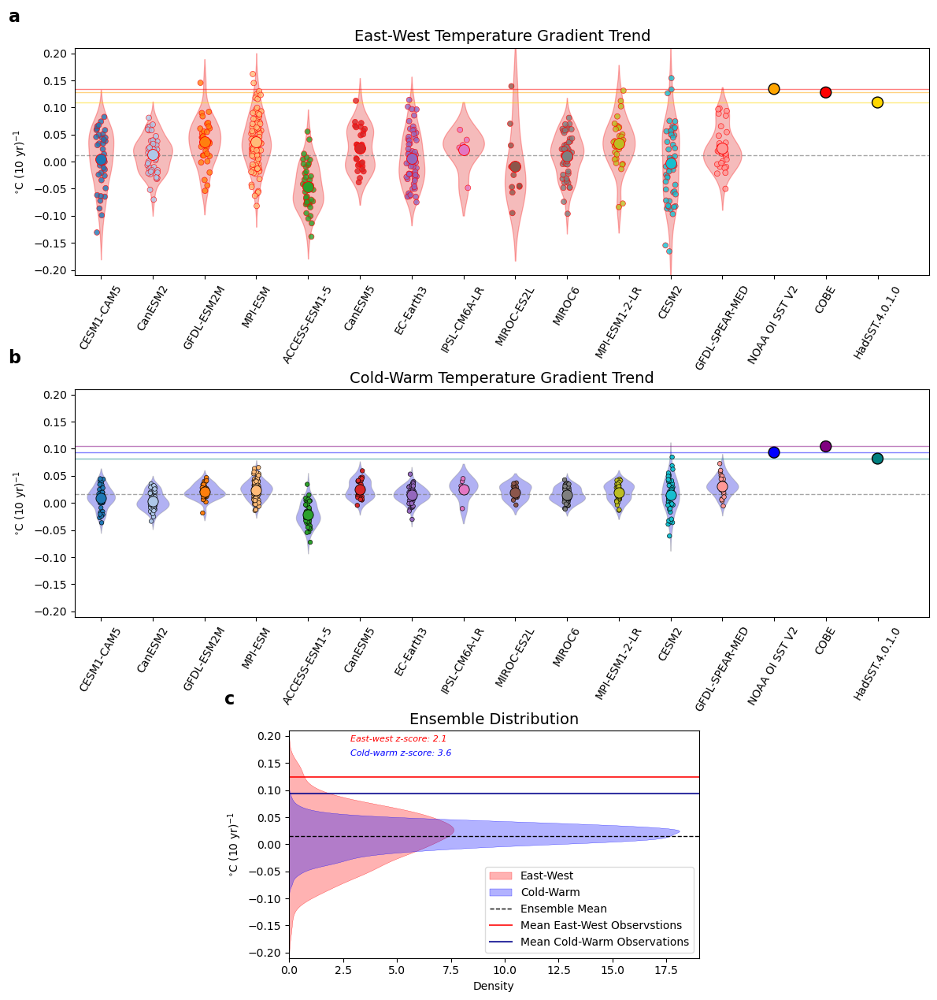

In [51]:
# Define Observations
# Prepare Observations Data for Seaborn
obs_data_p = pd.DataFrame({
    'Source': ['NOAA OISST', 'COBE', 'HAD'],
    'Cold-Warm': np.array([noaa_cold_warm, cobe_cold_warm, had_cold_warm])*10*12
})

obs_data_e = pd.DataFrame({
    'Source': ['NOAA OISST', 'COBE', 'HAD'],
    'East-West': np.array([noaa_east_west, cobe_east_west, had_east_west])*10*12
})

# percentile data 
data = cmip_warmcold_wills20*10*12
df_percentile = data.to_dataframe('trend').reset_index()
df_mean_percentile = data.mean(dim='ensemble_member').to_dataframe('trend').reset_index()


# normal
data2 = cmip_ma_eul20*10*12
df_eul = data2.to_dataframe('trend').reset_index()
df_mean_eul = data2.mean(dim='ensemble_member').to_dataframe('trend').reset_index()

# Calculate the mean for East-West and Cold-Warm gradients
mean_east_west_obs = np.mean([noaa_east_west, cobe_east_west, had_east_west])*10*12
mean_cold_warm_obs = np.mean([noaa_cold_warm, cobe_cold_warm, had_cold_warm])*10*12



# Initialize lists to store the flattened data and corresponding weights
all_values = []
all2_values = []
weights_all = []
weights_all2 = []

# Loop through each model and its ensemble members
for i in range(data.sizes['model']):
    # Extract non-NaN values for the current model and flatten them
    model_data = data.isel(model=i).values.flatten()
    valid_data = model_data[~np.isnan(model_data)]  # Keep only non-NaN values

    model_data2 = data2.isel(model=i).values.flatten()
    valid_data2 = model_data2[~np.isnan(model_data2)]  # Keep only non-NaN values

    # Skip models with no valid data to avoid division by zero
    if len(valid_data) == 0 or len(valid_data2) == 0:
        continue

    # Calculate weights (1 / ensemble size) for each valid data point
    weight = 1 / len(valid_data)
    weight2 = 1 / len(valid_data2)

    weights_all.extend([weight] * len(valid_data))
    weights_all2.extend([weight2] * len(valid_data2))

    # Store the valid data points
    all_values.extend(valid_data)
    all2_values.extend(valid_data2)

# Convert to numpy arrays for plotting
all_values = np.array(all_values)
all2_values = np.array(all2_values)
weights_all = np.array(weights_all)
weights_all2 = np.array(weights_all2)

# Ensure the lengths match
assert len(all_values) == len(weights_all), "Mismatch in data and weights length"
assert len(all2_values) == len(weights_all2), "Mismatch in data2 and weights2 length"



# calculate number of standard deviations mean obs are from the mean of the ensemble
z_eul = (mean_east_west_obs - np.mean(all2_values)) / np.std(all2_values)
z_per = (mean_cold_warm_obs - np.mean(all_values)) / np.std(all_values)

# print mean, and standard deviation
print('east-west mean:',np.mean(all2_values))
print('east-west std:',np.std(all2_values))
print('cold-warm mean:',np.mean(all_values))
print('cold-warm std:',np.std(all_values))

# print mean of obs 
print('east-west obs mean:',mean_east_west_obs)
print('cold-warm obs mean:',mean_cold_warm_obs)
##### Calculate the combined p-values
# from scipy.stats import norm
# import numpy as np

# from scipy.stats import norm
# from scipy.special import erfc
# import numpy as np

# # Calculate z-scores for each model (same logic as before)
# z_eul_scores = []
# z_per_scores = []

# for i in range(13):
#     # Handle East-West data (data2)
#     data2val = data2.isel(model=i).values
#     dt2 = data2val[~np.isnan(data2val)]

#     if np.std(dt2) > 0:
#         z_eul = (eval_metric - np.mean(dt2)) / np.std(dt2)
#         z_eul_scores.append(z_eul)
#     else:
#         z_eul_scores.append(0)  # No variability, z-score = 0

#     # Handle Cold-Warm data (data)
#     dataval = data.isel(model=i).values
#     dt = dataval[~np.isnan(dataval)]

#     if np.std(dt) > 0:
#         z_per = (pval_metric - np.mean(dt)) / np.std(dt)
#         z_per_scores.append(z_per)
#     else:
#         z_per_scores.append(0)  # No variability, z-score = 0

# # Convert lists to numpy arrays
# z_eul_scores = np.array(z_eul_scores)
# z_per_scores = np.array(z_per_scores)

# # Stouffer's method: Combine z-scores
# combined_z_eul = np.sum(z_eul_scores) / np.sqrt(len(z_eul_scores))
# combined_z_per = np.sum(z_per_scores) / np.sqrt(len(z_per_scores))

# # Calculate the combined p-values using erfc for better precision
# combined_p_eul = erfc(np.abs(combined_z_eul) / np.sqrt(2))
# combined_p_per = erfc(np.abs(combined_z_per) / np.sqrt(2))


colors = sns.color_palette([
    '#ff9896',  # Light Red
    '#1f77b4',  # Bold Blue
    '#aec7e8',  # Light Blue
    '#ff7f0e',  # Bold Orange
    '#ffbb78',  # Light Orange
    '#2ca02c',  # Bold Green
    '#d62728',  # Bold Red
    '#9467bd',  # Bold Purple
    '#e377c2',  # Light Pink
    '#8c564b',  # Bold Brown
    '#7f7f7f',  # Gray
    '#bcbd22',  # Bold Yellow-Green
    '#17becf'   # Bold Cyan
])

# Create a figure with 3 vertical panels (3 rows, 1 column)
fig = plt.figure(figsize=(14, 15))
gs = gridspec.GridSpec(3, 3, figure=fig, width_ratios=[1, 2.5, 1.1],hspace=0.5)  # Divide into 3 columns

### Panel 1: East-West Observations and Models Plot
ax1 = plt.subplot(gs[0, :])

# Observation lines for East-West gradient
ax1.axhline(y=noaa_e.iloc[0], color='red', linestyle='-', linewidth=1, alpha=0.5, label='_nolegend_')
ax1.axhline(y=cobe_e.iloc[0], color='orange', linestyle='-', linewidth=1, alpha=0.5, label='_nolegend_')
ax1.axhline(y=had_e.iloc[0], color='gold', linestyle='-', linewidth=1, alpha=0.5, label='_nolegend_')

ax1.axhline(y=np.mean(df_mean_eul.trend), color='gray', linestyle='--', linewidth=1, alpha=0.7)


# Plot models data (unchanged)
sns.stripplot(x='model', y='trend', data=df_eul, hue='model', palette=colors, edgecolor='red',
              linewidth=0.5, alpha=0.8, legend=False, size=5, ax=ax1)
sns.stripplot(x='model', y='trend', data=df_mean_eul, hue='model', palette=colors, edgecolor='red',
              linewidth=0.65, alpha=1, legend=False, size=10, ax=ax1)
sns.violinplot(x='model', y='trend', data=df_eul, inner=None, color='red', alpha=0.3, linewidth=0.9,
               edgecolor='red', ax=ax1)

# Plot observation points
# Plot East-West observations
# Use matplotlib scatter for observations with black outlines
ax1.scatter('Source', 'East-West', data=obs_data_e, color=['orange', 'red', 'gold'], 
            edgecolor='black', s=100, marker='o', zorder=3)

# Axis settings for Panel 1
ax1.set_ylim(-0.21, 0.21)
ax1.set_xlim(0.5, 17)
ax1.set_xticks(range(1, 17))
ax1.set_xticklabels(models + ['NOAA OI SST V2', 'COBE', 'HadSST.4.0.1.0'], rotation=60)
ax1.set_ylabel(r'$^{\circ}$C (10 yr)$^{-1}$')
ax1.set_title('East-West Temperature Gradient Trend',fontsize=14)
ax1.set_xlabel(None)  # Remove the unwanted y-axis label

### Panel 2: Cold-Warm Observations and Models Plot
ax2 = plt.subplot(gs[1, :])

# Observation lines for Cold-Warm gradient
ax2.axhline(y=noaa_p.iloc[0], color='blue', linestyle='-', linewidth=1, alpha=0.5)
ax2.axhline(y=cobe_p.iloc[0], color='purple', linestyle='-', linewidth=1, alpha=0.5)
ax2.axhline(y=had_p.iloc[0], color='teal', linestyle='-', linewidth=1, alpha=0.5)

ax2.axhline(y=np.mean(df_mean_percentile.trend), color='gray', linestyle='--', linewidth=1, alpha=0.7)


# Plot models data (unchanged)
sns.stripplot(x='model', y='trend', data=df_percentile, hue='model', palette=colors, edgecolor='black',
              linewidth=0.43, alpha=1, legend=False, size=4, jitter=0.05, ax=ax2)
sns.stripplot(x='model', y='trend', data=df_mean_percentile, hue='model', palette=colors, edgecolor='black',
              linewidth=0.6, alpha=1, legend=False, size=9.5, ax=ax2)
sns.violinplot(x='model', y='trend', data=df_percentile, inner=None, color='blue', alpha=0.35, linewidth=0.8,
               edgecolor='grey', ax=ax2)

# Plot observation points
# Plot Cold-Warm observations
ax2.scatter('Source', 'Cold-Warm', data=obs_data_p, color=['blue', 'purple', 'teal'], 
            edgecolor='black', s=100, marker='o', zorder=3)

# Axis settings for Panel 2
ax2.set_ylim(-0.21, 0.21)
ax2.set_xlim(0.5, 17)
ax2.set_xticks(range(1, 17))
ax2.set_xticklabels(models + ['NOAA OI SST V2', 'COBE', 'HadSST.4.0.1.0'], rotation=60)
ax2.set_ylabel(r'$^{\circ}$C (10 yr)$^{-1}$')
ax2.set_title('Cold-Warm Temperature Gradient Trend',fontsize=14)
ax2.set_xlabel(None)  # Remove the unwanted y-axis label

### Panel 3: Ensemble Distribution Plot
ax3 = plt.subplot(gs[2, 1])

# KDE plots for ensemble distributions
# Plot the weighted KDEs
sns.kdeplot(all2_values, weights=weights_all2, fill=True, vertical=True, ax=ax3, 
            color='red', alpha=0.3, linewidth=0.2, common_norm=True, label='East-West')
sns.kdeplot(all_values, weights=weights_all, fill=True, vertical=True, ax=ax3, 
            color='blue', alpha=0.3, linewidth=0.2, common_norm=True, label='Cold-Warm')
ax3.axhline(y=np.mean(all_values), color='black', linestyle='--', 
            linewidth=1, alpha=1, label='Ensemble Mean')

# Plot means of NOAA, COBE, and HAD for East-West and Cold-Warm
ax3.axhline(y=mean_east_west_obs, color='red', linestyle='-', linewidth=1.5, alpha=0.8, label='Mean East-West Observstions')
ax3.axhline(y=mean_cold_warm_obs, color='darkblue', linestyle='-', linewidth=1.5, alpha=0.8, label='Mean Cold-Warm Observations')


# Add text for p-values
ax3.text(0.15, 0.95, f"East-west z-score: {z_eul:.2}", color='red', fontsize=8, fontdict={'style': 'italic'}, transform=ax3.transAxes)
ax3.text(0.15, 0.89, f"Cold-warm z-score: {z_per:.2}", color='blue', fontsize=8, fontdict={'style': 'italic'}, transform=ax3.transAxes)
ax3.set_ylabel(r'$^{\circ}$C (10 yr)$^{-1}$')

ax3.legend(loc='lower right', fontsize=10, frameon=True, framealpha=0.7)

# Axis settings for Panel 3
ax3.set_xlabel('Density')
ax3.set_ylim(-0.21, 0.21)
ax3.set_title('Ensemble Distribution', fontsize=14)

# Label for ax1 (top row, spanning all columns)
ax1.annotate('a', xy=(0, 1), xycoords='axes fraction', fontsize=16, fontweight='bold', 
             xytext=(-50, 20), textcoords='offset points', ha='right', va='bottom')

# Label for ax2 (middle row, spanning all columns)
ax2.annotate('b', xy=(0, 1), xycoords='axes fraction', fontsize=16, fontweight='bold', 
             xytext=(-50, 20), textcoords='offset points', ha='right', va='bottom')

# Label for ax3 (bottom row, center column only)
ax3.annotate('c', xy=(0, 1), xycoords='axes fraction', fontsize=16, fontweight='bold', 
             xytext=(-50, 20), textcoords='offset points', ha='right', va='bottom')
# Adjust the subplot layout to make room for the legend
# plt.tight_layout()
plt.savefig(os.path.expanduser("~/Desktop/EastWest_ColdWarm.pdf"), bbox_inches='tight')



In [52]:
len(all_values)

519

In [53]:
eastwest_mean=0.01309000967974231
eastwest_std=0.05233490310574332
coldwarm_mean=0.014705295355533709
coldwarm_std=0.02207175066385349
eastwest_obs_mean= 0.12367183477061323
coldwarm_obs_mean=0.09311991065832982
n_eastwest = len(all2_values)
n_coldwarm = len(all_values)


# calculate p values of obs from east-west distribution

# calculate p-values for eas-west distribution
# Compute the cumulative distribution function (CDF)
cdf = norm.cdf(eastwest_obs_mean, loc=eastwest_mean, scale=eastwest_std)
# Compute two-tailed p-value
p_value_eastwest = 2 * min(cdf, 1 - cdf)
del cdf
print(p_value_eastwest)

# calculate p-values for cold-warm distribution
cdf = norm.cdf(coldwarm_obs_mean, loc=coldwarm_mean, scale=coldwarm_std)
p_value_coldwarm = 2 * min(cdf, 1 - cdf)
print(p_value_coldwarm)




0.034603752961685164
0.00038127890214689764


## mean-state

In [56]:
mean_state_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/mean_state_dict.npy',allow_pickle='TRUE').item()
trends_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/trends_dict.npy',allow_pickle='TRUE').item()
mean_state_dict_normal = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/mean_state_dict_normal.npy',allow_pickle='TRUE').item()

# # percent
percent_mean_state_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/percent_mean_state_dict.npy',allow_pickle='TRUE').item()
# percent_trends_dict = np.load('/Users/isabelaconde/Desktop/ma_ncfiles/dicts/percent_trends_dict.npy',allow_pickle='TRUE').item()
# percent_mean_state_dict_normal = np.load('/Users/isabelaconde/Desktop/ma_ncfiles/dicts/percent_mean_state_dict_normal.npy',allow_pickle='TRUE').item()
# mean_state_trop_rel_dict = np.load('/Users/isabelaconde/Desktop/ma_ncfiles/dicts/mean_state_trop_rel_dict.npy',allow_pickle='TRUE').item()


# # percent
east_west_trend_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/east_west_trend_dict.npy',allow_pickle='TRUE').item()
east_west_mean_state_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/east_west_mean_state_dict.npy',allow_pickle='TRUE').item()
warm_cold_mean_state_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/warm_cold_mean_state_dict.npy',allow_pickle='TRUE').item()
warm_cold_trend_dict = np.load('/Users/isabelaconde/Desktop/data/ma_ncfiles/dicts/warm_cold_trend_dict.npy',allow_pickle='TRUE').item()


In [57]:
dt_trends_maps = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/cmip_trend_maps.nc')

In [58]:
east_west_dict=extract_non_nan_values(cmip_ma_eul20,models)
cold_warm_dict=extract_non_nan_values(cmip_warmcold_wills20,models)

In [1]:
# Data for figure 5
dt_percentile_trends = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_percentiles_trend.nc')
dt_percentiles = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_percentile_cmip_pacific_198201-202001_lat20.nc')
# dt_gridded_pa = xr.open_datatree('/Users/isabelaconde/Desktop/final_data/dt_cmip_gridded_pa.nc')

# percentile data 
# data = cmip_warmcold_wills20*10*12
# east_west_dict = data.to_dataframe('trend').reset_index().to_dict(orient='records')
# mean_east_west_dict = data.mean(dim='ensemble_member').to_dataframe('trend').reset_index().to_dict(orient='records')


# # a) axis [0,0]: east-west trend vs. up welling zone
# data2 = cmip_ma_eul20*10*12
# east_west_dict = extract_non_nan_values(data2,models)


# # trend of upwelling region (250,290) and (-20,0)
trend_upwelling_region = dt_trends_maps.sel(lat=slice(-20, 0), lon=slice(250, 290)).stack(stack=('lat', 'lon')).mean(dim='stack')*10*12
da_trend_upwelling_region = main_dataarray_trend_type(trend_upwelling_region)*10*12
trend_upwelling_region_dict=extract_non_nan_values(da_trend_upwelling_region,models)

# b) axis [0,1]: coldest 5% vs. cold warm trend
# cold-warm trend
# data = cmip_warmcold_wills20*10*12
# cold_warm_dict = extract_non_nan_values(data2,models)

# coldest 5%
# dt_coldest = dt_percentile_trends.sel(area = slice(0,0.05)).mean(dim='area')*10*12
# coldest_5_dict={}
# for m in models:
#     coldest_5_dict[m] = dt_coldest[m].grad.values


# d) axis [1,0]: mean state of coldest 5% vs. trend of coldest 5%
dt_percentiles_time_avg = dt_percentiles.sel(area = slice(0,0.05)).mean(dim='area').mean(dim='time')
da_mean_state_coldest5 = main_dataarray_trend_type(dt_percentiles_time_avg) #this just isn't working right
mean_state_coldest_5_dict=extract_non_nan_values(da_trend_upwelling_region,models)


# c) mean state and trend of upwelling region



In [61]:
dt_trends_maps

<xarray.DataTree>
Group: /
├── Group: /CESM1-CAM5
│   ├── Group: /CESM1-CAM5/r14i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r30i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r28i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r40i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r2i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r7i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r5i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r38i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r1i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r8i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   │           trend    (lat, lon) float64 28kB ...
│   ├── Group: /CESM1-CAM5/r25i1p1
│   │       Dimensions:  (lat: 24, lon: 144)
│   │       Coordinates:
│   │         * lat      (lat) float64 192B -28.75 -26.25 -23.75 ... 23.75 26.25 28.75
│   │         * lon      (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
│   │       Data variables:
│   

In [62]:
# upwelling region seperate
upwelling_region_mean_state = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_upwelling_region_mean_state_g025.nc')
upwelling_region_trend = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_upwelling_region_trend_g025.nc')

# coldest 5% 
coldest5_mean_state = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_coldest5_mean_state.nc')
coldest5_trend = xr.open_datatree('/Users/isabelaconde/Desktop/data/final_data/dt_cmip_coldest5_trend.nc')

In [63]:
obs_trend_coldest5 = [-0.00062513,-0.00081657, -0.00067994]
obs_mean_state_coldest5 =[21.06851115, 21.25174476, 21.09663085]

obs_trend_upwelling = [-0.0006169 , -0.00096884, -0.00065289]
obs_mean_state_upwelling = [21.77562904, 21.78511429, 21.57102402]



In [64]:
# main_dataarray(upwelling_region_mean_state)

trend_dt=upwelling_region_mean_state
model_array={}
# # print('converting datatree to arrays for each model')
for m in range(len(models)):
    
    sources = mods[models[m]][0:len(mods[models[m]])]
    da=[] # initialise array for grad values
    for i in range(len(sources)):
        da.extend([trend_dt[models[m]+'/'+sources[i]].tos.values]) # for east-west and cold-warm temp gradients remove square brackets, also change trend to grad
    
    model_array[m]= xr.DataArray(da, dims = 'ensemble_members',coords = {'ensemble_members':sources})

print('initial arrays done')

# # Create an empty DataArray
main_array = xr.DataArray()

ensemble_sizes = [len(mods[models[m]]) for m in range(len(models))] # list of ensemble sizes

# Loop through each model
for model, ensemble_size in zip(models, ensemble_sizes):
    # print(models.index(model))
    data_values = model_array[models.index(model)] 
    ensemble_members = mods[model]

    # Create a DataArray for each ensemble member
    data = xr.DataArray(
        data_values,
        dims=['ensemble_member'],
        coords={'ensemble_member': ensemble_members},
        name='temp'
    )

    # Concatenate along a new dimension representing different models
    main_array = xr.concat([main_array, data], dim='model')

print('main_array_done')
main_array
mean_state_upwelling_region_dict=extract_non_nan_values(main_array,models)
mean_state_upwelling_region_dict

initial arrays done
main_array_done


{'CESM1-CAM5': array([22.36314002, 22.35156469, 22.53250655, 22.41969752, 22.36664562,
        22.46660902, 22.43814805, 22.55929719, 22.46240668, 22.48936792,
        22.5313483 , 22.4483489 , 22.46543568, 22.46493216, 22.41113556,
        22.38134826, 22.42182449, 22.45154154, 22.40902635, 22.49899625,
        22.49099913, 22.34502419, 22.40169615, 22.4357093 , 22.29576507,
        22.49326364, 22.40730237, 22.35481816, 22.52682887, 22.48556111,
        22.55725598, 22.50559946, 22.27881101, 22.48510112, 22.45349466,
        22.29378507, 22.45319474, 22.29249959, 22.35686435, 22.2142208 ]),
 'CanESM2': array([24.39425442, 24.25511718, 24.25380285, 24.15153856, 24.3662371 ,
        24.35306141, 24.21316955, 24.34595631, 24.33025902, 24.35466843,
        24.24431461, 24.23279147, 24.36466152, 24.21052504, 24.305057  ,
        24.25992873, 24.27526357, 24.26784138, 24.1834373 , 24.27354481,
        24.20196773, 24.29275247, 24.23078572, 24.27719841, 24.29201675,
        24.32950574, 24.

In [2]:
# main_dataarray(upwelling_region_mean_state)

trend_dt=coldest5_trend
model_array={}
# # print('converting datatree to arrays for each model')
for m in range(len(models)):
    
    sources = mods[models[m]][0:len(mods[models[m]])]
    da= trend_dt[models[m]].grad.values # for east-west and cold-warm temp gradients remove square brackets, also change trend to grad
    
    model_array[m]= xr.DataArray(da, dims = 'ensemble_members',coords = {'ensemble_members':sources})

print('initial arrays done')

# Create an empty DataArray
main_array = xr.DataArray()

ensemble_sizes = [len(mods[models[m]]) for m in range(len(models))] # list of ensemble sizes

# Loop through each model
for model, ensemble_size in zip(models, ensemble_sizes):
    # print(models.index(model))
    data_values = model_array[models.index(model)] 
    ensemble_members = mods[model]

    # Create a DataArray for each ensemble member
    data = xr.DataArray(
        data_values,
        dims=['ensemble_member'],
        coords={'ensemble_member': ensemble_members},
        name='temp'
    )

    # Concatenate along a new dimension representing different models
    main_array = xr.concat([main_array, data], dim='model')

print('main_array_done')
main_array
trend_coldest5_dict=extract_non_nan_values(main_array,models)
trend_coldest5_dict


In [65]:
def extract_non_nan_values(data, models):

    data_dict = {}
    for idx, model in enumerate(data['model'].values[1:]):  # Skip the first model
        values = data.sel(model=model).values.flatten()  # Flatten the array
        non_nan_values = values[~np.isnan(values)]  # Filter out NaNs
        data_dict[models[idx]] = non_nan_values  # Use model name as key
    return data_dict


In [66]:
# Define Observations
# Prepare Observations Data for Seaborn
obs_data_p = pd.DataFrame({
    'Source': ['NOAA OISST', 'COBE', 'HAD'],
    'Cold-Warm': [noaa_p.values[0], cobe_p.values[0], had_p.values[0]]
})

obs_data_e = pd.DataFrame({
    'Source': ['NOAA OISST', 'COBE', 'HAD'],
    'East-West': [noaa_e.values[0], cobe_e.values[0], had_e.values[0]]
})


In [67]:
def combine_model_data(data):
    """
    Combine model data into a single array for plotting.
    
    Parameters:
    - data: dictionary with model names as keys and arrays of data as values.
    
    Returns:
    - A tuple containing the combined data array and the corresponding weights.
    """
    all_values = []
    weights = []
    for model, values in data.items():
        # Calculate weights (1 / ensemble size) for each valid data point
        weight = 1 / len(values)
        weights.extend([weight] * len(values))
        # Store the valid data points
        all_values.extend(values)
    return np.array(all_values)

In [68]:

def linear_fit_plot_data(x_values, y_values):
    """
    return x and y values for linear values of combined model data
    
    Parameters:
    - data: combined model data for x and y values
    
    Returns:
    - linear fit values for plotting
    """

    # sort by lowest x vlaues

    # Get sorted indices based on x values
    sorted_indices = np.argsort(x_values)

    # Sort both x and y using these indices
    x_sorted = x_values[sorted_indices]
    y_sorted = y_values[sorted_indices]

    # apply linear fit
    slope, intercept = np.polyfit(x_sorted, y_sorted, 1)

    # Calculate the linear fit values
    y_fit = slope * x_sorted + intercept

    # correlation coefficient   
    corr = np.corrcoef(x_sorted, y_sorted)[0, 1]
    return x_sorted, y_fit, slope, corr


In [6]:
colors = sns.color_palette([
    '#ff9896',  # Light Red
    '#1f77b4',  # Bold Blue
    '#aec7e8',  # Light Blue
    '#ff7f0e',  # Bold Orange
    '#ffbb78',  # Light Orange
    '#2ca02c',  # Bold Green
    '#d62728',  # Bold Red
    '#9467bd',  # Bold Purple
    '#e377c2',  # Light Pink
    '#8c564b',  # Bold Brown
    '#7f7f7f',  # Gray
    '#bcbd22',  # Bold Yellow-Green
    '#17becf'   # Bold Cyan
])

# Set up the 2x2 grid of plots
fig, axs = plt.subplots(2, 2, figsize=(13, 9))


### Panel 1: East-West Trend vs. Upwelling Region Trend

# find linear fit from combined data
x_values = combine_model_data(trend_upwelling_region_dict)
y_values = combine_model_data(east_west_dict)
x_fit, y_fit, slope, corr = linear_fit_plot_data(x_values, y_values)
axs[0, 0].plot(x_fit*10*12, y_fit*10*12, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
# Display slope in the top right corner of the plot
axs[0, 0].text(0.4, 0.17, f'Slope: {slope:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic')
# displsy correlation coefficient under slope
axs[0, 0].text(0.4, 0.15, f'Correlation: {corr:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic')

# delete linear fit variables
del x_values, y_values, slope, x_fit, y_fit


# Fourth subplot
for m in range(len(models)):
    axs[0, 0].scatter(trend_upwelling_region_dict[models[m]]*10*12, east_west_dict[models[m]]*10*12, label=models[m], color=colors[m], alpha=0.7)
    axs[0, 0].scatter((trend_upwelling_region_dict[models[m]]).mean()*10*12, (east_west_dict[models[m]]).mean()*10*12, color=colors[m], s=300, edgecolors='black', linewidths=1)
# obs
axs[0, 0].scatter(obs_trend_upwelling[0]*10*12,noaa_e.values[0], color='blue', label='NOAA OISST', marker='^', s=200)
axs[0, 0].scatter(obs_trend_upwelling[1]*10*12,cobe_e.values[0], color='purple', label='COBE', marker='^', s=200)
axs[0, 0].scatter(obs_trend_upwelling[2]*10*12,had_e.values[0], color='teal', label='HadSST.4.0.1.0', marker='^', s=200)

axs[0, 0].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
axs[0, 0].set_xlim(-0.15, 0.5)
axs[0, 0].set_ylim(-0.18, 0.18)
axs[0, 0].set_xlabel(r'Upwelling Region Trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[0, 0].set_ylabel(r'East-West Trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[0, 0].set_title(r'Upwelling Region Trend Vs. East-West Trend',    fontsize=14)


# find linear fit from combined data
x_values = combine_model_data(trend_coldest5_dict)
y_values = combine_model_data(cold_warm_dict)
x_fit, y_fit, slope, corr = linear_fit_plot_data(x_values, y_values)
axs[0, 1].plot(x_fit*10*12, y_fit*10*12, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
# Display slope in the top right corner of the plot
axs[0, 1].text(0.4, 0.17, f'Slope: {slope:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic')
# display correlation coefficient under slope
axs[0, 1].text(0.4, 0.15, f'Correlation: {corr:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic')

# delete linear fit variables
del x_values, y_values, slope, x_fit, y_fit



# Third subplot
for m in range(len(models)):
    axs[0, 1].scatter(trend_coldest5_dict[models[m]]*10*12, cold_warm_dict[models[m]]*10*12, label=models[m], color=colors[m], alpha=0.7)
    axs[0, 1].scatter((trend_coldest5_dict[models[m]]).mean()*10*12, (cold_warm_dict[models[m]]).mean()*10*12, color=colors[m], s=300, edgecolors='black', linewidths=1)
    
axs[0, 1].scatter(obs_trend_coldest5[0]*10*12,noaa_p.values[0], color='blue', label='NOAA OISST', marker='^', s=200)
axs[0, 1].scatter(obs_trend_coldest5[1]*10*12,cobe_p.values[0], color='purple', label='COBE', marker='^', s=200)
axs[0, 1].scatter(obs_trend_coldest5[2]*10*12,had_p.values[0], color='teal', label='HadSST.4.0.1.0', marker='^', s=200)

axs[0, 1].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
axs[0, 1].set_xlim(-0.15, 0.5)
axs[0, 1].set_ylim(-0.18, 0.18)
axs[0, 1].set_xlabel(r'Coldest 5% Trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[0, 1].set_ylabel(r'Cold-Warm Trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[0, 1].set_title(r'Coldest 5% Trend Vs. Cold-Warm Trend',    fontsize=14)


# find linear fit from combined data
x_values = combine_model_data(mean_state_upwelling_region_dict)
y_values = combine_model_data(trend_upwelling_region_dict)
x_fit, y_fit, slope, corr = linear_fit_plot_data(x_values, y_values)
axs[1, 0].plot(x_fit, y_fit*10*12, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
# Display slope in the top left corner of the plot
axs[1, 0].text(0.35, 0.95, f'Slope:  {slope:.1e}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic', transform=axs[1, 0].transAxes)
# display correlation coefficient under slope
axs[1, 0].text(0.35, 0.90, f'Correlation: {corr:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic', transform=axs[1, 0].transAxes)

# delete linear fit variables
del x_values, y_values, slope, x_fit, y_fit, corr


# First subplot
for m in range(len(models)):
    axs[1, 0].scatter(mean_state_upwelling_region_dict[models[m]],trend_upwelling_region_dict[models[m]]*10*12, label=models[m],color = colors[m],alpha=0.7)
    axs[1, 0].scatter((mean_state_upwelling_region_dict[models[m]]).mean(),(trend_upwelling_region_dict[models[m]]*12*10).mean(),color = colors[m],s=300,edgecolors='black', linewidths=1)
# axs[1, 0].scatter(23.0404478,-0.15146791, color='k',label='NOAA OISST',marker='^',s=200)
axs[1, 0].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
#obs
axs[1, 0].scatter(obs_mean_state_upwelling[0],obs_trend_upwelling[0]*10*12, color='blue', label='NOAA OISST', marker='^', s=200)
axs[1, 0].scatter(obs_mean_state_upwelling[1],obs_trend_upwelling[1]*10*12, color='purple', label='COBE', marker='^', s=200)
axs[1, 0].scatter( obs_mean_state_upwelling[2],obs_trend_upwelling[2]*10*12, color='teal', label='HadSST.4.0.1.0', marker='^', s=200)

axs[1, 0].set_xlim(21.25, 25.5)
axs[1, 0].set_ylim(-0.15, 0.5)
axs[1, 0].set_xlabel(r'Upwelling Region Mean state ($^{\circ}$C)')
axs[1, 0].set_ylabel(r'Upwelling Region trend ($^{\circ}$C (10 yr)$^{-1}$)')
axs[1, 0].set_title(r'Coastal Upwelling Mean State Vs. Trend of Coastal Upwelling', fontsize=14)



# find linear fit from combined data
x_values = combine_model_data(coldest5_mean_state_dict)
y_values = combine_model_data(trend_coldest5_dict)
x_fit, y_fit, slope, corr = linear_fit_plot_data(x_values, y_values)
axs[1, 1].plot(x_fit, y_fit*10*12, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
# Display slope in the top left corner of the plot
axs[1, 1].text(1.55, 0.95, f'Slope:  {slope:.1e}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic', transform=axs[1, 0].transAxes)
# display correlation coefficient under slope
axs[1, 1].text(1.55, 0.90, f'Correlation: {corr:.2f}', ha='right', va='top', fontsize=12, color='black', fontstyle='italic', transform=axs[1, 0].transAxes)

# delete linear fit variables
del x_values, y_values, slope, x_fit, y_fit, corr


# Second subplot
for m in range(len(models)):
    axs[1, 1].scatter(coldest5_mean_state_dict[models[m]], trend_coldest5_dict[models[m]]*12*10, label=models[m],color = colors[m],alpha=0.7)
    axs[1, 1].scatter(coldest5_mean_state_dict[models[m]].mean(),(trend_coldest5_dict[models[m]]*12*10).mean(),color = colors[m],s=300,edgecolors='black', linewidths=1)
# axs[1, 1].scatter(23.12,-0.00048827*38*12, color='k',label='NOAA OISST',marker='^',s=200)
axs[1, 1].grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
axs[1, 1].set_xlim(20.4, 23)
axs[1, 1].set_ylim(-0.15, 0.5)
axs[1, 1].scatter(obs_mean_state_coldest5[0],obs_trend_coldest5[0]*10*12, color='blue', label='NOAA OISST', marker='^', s=200)
axs[1, 1].scatter(obs_mean_state_coldest5[1],obs_trend_coldest5[1]*10*12, color='purple', label='COBE', marker='^', s=200)
axs[1, 1].scatter( obs_mean_state_coldest5[2],obs_trend_coldest5[2]*10*12, color='teal', label='HadSST.4.0.1.0', marker='^', s=200)

axs[1, 1].set_xlabel(r'Coldest 5% mean state ($^{\circ}$C)')
axs[1, 1].set_ylabel(r'Trend of the coldest 5% ($^{\circ}$C (10 yr)$^{-1}$)')
axs[1, 1].set_title(r'Coldest 5% Mean State Vs. Trend of Coldest 5%', fontsize=14)

# Adding labels a, b, c, d outside the top left corner of each subplot
axs[0, 0].text(-0.15, 1.05, "a", transform=axs[0, 0].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
axs[0, 1].text(-0.15, 1.05, "b", transform=axs[0, 1].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
axs[1, 0].text(-0.15, 1.05, "c", transform=axs[1, 0].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')
axs[1, 1].text(-0.15, 1.05, "d", transform=axs[1, 1].transAxes, fontsize=16, fontweight='bold', va='top', ha='right')

# Create a common legend
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', fontsize='medium', bbox_to_anchor=(1.13, 0.7))

# Adjust layout
plt.tight_layout()
# plt.show()

# plt.savefig(os.path.expanduser("~/Desktop/fig4.png"), bbox_inches='tight')


- also correlation of model means